### 그냥 dmlp

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import os
from tqdm.auto import tqdm # ⭐️ tqdm 라이브러리 임포트

# CUDA 에러 발생 시 더 정확한 위치를 알려주는 디버깅 옵션
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# --- 1. 데이터 로딩 및 준비 ---
print("--- 1. 데이터 로딩 및 준비 ---")
# ... (이전 코드와 동일) ...
DATA_PATH = 'formodel1.csv'
N_CLASSES = 40
df = pd.read_csv(DATA_PATH)
df_filtered = df[df['killer_cluster'] != -1].copy()
if 'player_name' in df_filtered.columns:
    features = df_filtered.drop(columns=['player_name', 'killer_cluster'])
else:
    features = df_filtered.drop(columns=['killer_cluster'])
target = df_filtered['killer_cluster']
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=42, stratify=target
)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long)
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=4096, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4096, shuffle=False)

# --- 2. 신경망 모델 클래스 정의 ---
print("\n--- 2. 신경망 모델 구축 ---")
# ... (이전 코드와 동일) ...
n_features = X_train_scaled.shape[1]
class Net(nn.Module):
    def __init__(self, num_features, num_classes):
        super(Net, self).__init__()
        self.layer_1 = nn.Linear(num_features, 128)
        self.layer_2 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.3)
    def forward(self, x):
        x = self.relu(self.layer_1(x))
        x = self.dropout(x)
        x = self.relu(self.layer_2(x))
        x = self.dropout(x)
        x = self.layer_out(x)
        return x
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Net(n_features, N_CLASSES).to(device)

# --- 3. 손실 함수와 옵티마이저 정의 ---
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# --- 4. 모델 학습 ---
print("\n--- 4. 모델 학습 ---")
epochs = 50
best_loss = float('inf')
patience = 10
patience_counter = 0

# ⭐️ 전체 epoch에 대한 진행도 바
for epoch in range(epochs):
    model.train()
    train_loss = 0.0
    
    # ⭐️ 학습 데이터 로더를 tqdm으로 감싸기
    train_progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Training]", leave=False)
    for inputs, labels in train_progress_bar:
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        # ⭐️ 진행도 바에 현재 loss 표시
        train_progress_bar.set_postfix(loss=loss.item())
    
    model.eval()
    val_loss = 0
    # ⭐️ 검증 데이터 로더를 tqdm으로 감싸기
    val_progress_bar = tqdm(test_loader, desc=f"Epoch {epoch+1}/{epochs} [Validation]", leave=False)
    with torch.no_grad():
        for inputs, labels in val_progress_bar:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            val_loss += criterion(outputs, labels).item()
            val_progress_bar.set_postfix(loss=criterion(outputs, labels).item())

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(test_loader)
    
    # 에포크 종료 후 한 줄로 깔끔하게 결과 출력
    print(f"Epoch {epoch+1}/{epochs} -> Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    if avg_val_loss < best_loss:
        best_loss = avg_val_loss
        patience_counter = 0
        # torch.save(model.state_dict(), 'best_model.pth')
    else:
        patience_counter += 1
    
    if patience_counter >= patience:
        print("검증 손실이 개선되지 않아 조기 종료합니다.")
        break

# --- 5. 모델 평가 ---
# ... (이전 코드와 동일) ...
print("\n--- 5. 모델 평가 ---")
model.eval()
all_preds = []
all_labels = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
print("\n분류 리포트:")
print(classification_report(all_labels, all_preds, zero_division=0))

--- 1. 데이터 로딩 및 준비 ---

--- 2. 신경망 모델 구축 ---

--- 4. 모델 학습 ---


Epoch 1/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 1/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1/50 -> Train Loss: 2.4612, Val Loss: 1.4680


Epoch 2/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 2/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2/50 -> Train Loss: 1.3480, Val Loss: 0.9932


Epoch 3/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 3/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3/50 -> Train Loss: 1.0430, Val Loss: 0.7751


Epoch 4/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 4/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4/50 -> Train Loss: 0.8857, Val Loss: 0.6491


Epoch 5/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 5/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5/50 -> Train Loss: 0.7853, Val Loss: 0.5701


Epoch 6/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 6/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6/50 -> Train Loss: 0.7149, Val Loss: 0.5187


Epoch 7/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 7/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7/50 -> Train Loss: 0.6569, Val Loss: 0.4708


Epoch 8/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 8/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 8/50 -> Train Loss: 0.6081, Val Loss: 0.4402


Epoch 9/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 9/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 9/50 -> Train Loss: 0.5701, Val Loss: 0.4152


Epoch 10/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 10/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 10/50 -> Train Loss: 0.5415, Val Loss: 0.3965


Epoch 11/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 11/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 11/50 -> Train Loss: 0.5181, Val Loss: 0.3832


Epoch 12/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 12/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 12/50 -> Train Loss: 0.5024, Val Loss: 0.3767


Epoch 13/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 13/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 13/50 -> Train Loss: 0.4883, Val Loss: 0.3661


Epoch 14/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 14/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 14/50 -> Train Loss: 0.4769, Val Loss: 0.3597


Epoch 15/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 15/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 15/50 -> Train Loss: 0.4682, Val Loss: 0.3553


Epoch 16/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 16/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 16/50 -> Train Loss: 0.4591, Val Loss: 0.3494


Epoch 17/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 17/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 17/50 -> Train Loss: 0.4522, Val Loss: 0.3467


Epoch 18/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 18/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 18/50 -> Train Loss: 0.4460, Val Loss: 0.3432


Epoch 19/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 19/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 19/50 -> Train Loss: 0.4410, Val Loss: 0.3383


Epoch 20/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 20/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 20/50 -> Train Loss: 0.4362, Val Loss: 0.3355


Epoch 21/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 21/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 21/50 -> Train Loss: 0.4308, Val Loss: 0.3336


Epoch 22/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 22/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 22/50 -> Train Loss: 0.4257, Val Loss: 0.3300


Epoch 23/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 23/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 23/50 -> Train Loss: 0.4224, Val Loss: 0.3286


Epoch 24/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 24/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 24/50 -> Train Loss: 0.4194, Val Loss: 0.3261


Epoch 25/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 25/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 25/50 -> Train Loss: 0.4165, Val Loss: 0.3232


Epoch 26/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 26/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 26/50 -> Train Loss: 0.4134, Val Loss: 0.3244


Epoch 27/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 27/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 27/50 -> Train Loss: 0.4101, Val Loss: 0.3195


Epoch 28/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 28/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 28/50 -> Train Loss: 0.4067, Val Loss: 0.3197


Epoch 29/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 29/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 29/50 -> Train Loss: 0.4042, Val Loss: 0.3164


Epoch 30/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 30/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 30/50 -> Train Loss: 0.4017, Val Loss: 0.3142


Epoch 31/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 31/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 31/50 -> Train Loss: 0.4001, Val Loss: 0.3130


Epoch 32/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 32/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 32/50 -> Train Loss: 0.3981, Val Loss: 0.3126


Epoch 33/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 33/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 33/50 -> Train Loss: 0.3954, Val Loss: 0.3138


Epoch 34/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 34/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 34/50 -> Train Loss: 0.3934, Val Loss: 0.3119


Epoch 35/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 35/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 35/50 -> Train Loss: 0.3914, Val Loss: 0.3101


Epoch 36/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 36/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 36/50 -> Train Loss: 0.3899, Val Loss: 0.3097


Epoch 37/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 37/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 37/50 -> Train Loss: 0.3881, Val Loss: 0.3076


Epoch 38/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 38/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 38/50 -> Train Loss: 0.3871, Val Loss: 0.3064


Epoch 39/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 39/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 39/50 -> Train Loss: 0.3846, Val Loss: 0.3044


Epoch 40/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 40/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 40/50 -> Train Loss: 0.3842, Val Loss: 0.3037


Epoch 41/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 41/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 41/50 -> Train Loss: 0.3821, Val Loss: 0.3048


Epoch 42/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 42/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 42/50 -> Train Loss: 0.3802, Val Loss: 0.3027


Epoch 43/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 43/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 43/50 -> Train Loss: 0.3798, Val Loss: 0.3007


Epoch 44/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 44/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 44/50 -> Train Loss: 0.3781, Val Loss: 0.3007


Epoch 45/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 45/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 45/50 -> Train Loss: 0.3775, Val Loss: 0.3006


Epoch 46/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 46/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 46/50 -> Train Loss: 0.3760, Val Loss: 0.2986


Epoch 47/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 47/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 47/50 -> Train Loss: 0.3763, Val Loss: 0.2985


Epoch 48/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 48/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 48/50 -> Train Loss: 0.3737, Val Loss: 0.2974


Epoch 49/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 49/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 49/50 -> Train Loss: 0.3728, Val Loss: 0.2983


Epoch 50/50 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 50/50 [Validation]:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 50/50 -> Train Loss: 0.3720, Val Loss: 0.2988

--- 5. 모델 평가 ---

분류 리포트:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      7251
           2       0.85      0.98      0.91      1710
           3       0.84      0.86      0.85      4446
           4       0.91      0.97      0.94      3877
           5       0.97      0.98      0.98      6733
           6       0.89      0.66      0.76      1012
           7       0.96      0.99      0.97     26376
           8       0.97      0.99      0.98      1151
           9       0.97      0.98      0.98      6818
          10       0.89      0.97      0.93        87
          11       0.95      0.86      0.90       256
          12       0.88      0.98      0.92       920
          13       0.89      0.98      0.93      3247
          14       0.89      0.86      0.88       612
          15       0.84      0.90      0.87     14157
          16       0.91      0.54      0.67      1065
  

### 부족 클래스 가중치 DMLP

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_class_weight
import os
from tqdm.auto import tqdm

# CUDA 에러 발생 시 더 정확한 위치를 알려주는 디버깅 옵션
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# --- 1. 데이터 로딩 및 준비 ---
print("--- 1. 데이터 로딩 및 준비 ---")
DATA_PATH = 'formodel1.csv'
N_CLASSES = 40

try:
    df = pd.read_csv(DATA_PATH)
    print(f"'{DATA_PATH}' 파일 로딩 성공!")
except FileNotFoundError:
    print(f"오류: '{DATA_PATH}'을 찾을 수 없습니다. 예제 실행을 위해 가상 데이터를 생성합니다.")
    # 가상 데이터 생성
    num_samples = 10000
    num_features = 12
    data = np.random.rand(num_samples, num_features)
    df = pd.DataFrame(data, columns=[f'feature_{i}' for i in range(num_features)])
    df['killer_cluster'] = np.random.randint(0, N_CLASSES, num_samples)
    df = df[df['killer_cluster'] != 1]
    df.loc[df.sample(frac=0.1).index, 'killer_cluster'] = -1
    df.to_csv(DATA_PATH, index=False)

# -1 클러스터 제외
df_filtered = df[df['killer_cluster'] != -1].copy()
print(f"원본 데이터 {len(df)}개 -> -1 클러스터 제외 후 {len(df_filtered)}개 데이터 사용")

# 특징(X)과 타겟(y) 분리
if 'player_name' in df_filtered.columns:
    features = df_filtered.drop(columns=['player_name', 'killer_cluster'])
else:
    features = df_filtered.drop(columns=['killer_cluster'])
target = df_filtered['killer_cluster']

# 학습 데이터와 테스트 데이터 분리
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=42, stratify=target
)

# GPU 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 클래스 가중치 계산
print("\n--- 클래스 가중치 계산 ---")
unique_classes_in_train = np.unique(y_train)
weights_for_present_classes = compute_class_weight(
    class_weight='balanced', classes=unique_classes_in_train, y=y_train
)
full_weights = np.ones(N_CLASSES, dtype=np.float32)
full_weights[unique_classes_in_train] = weights_for_present_classes
class_weights = torch.tensor(full_weights, dtype=torch.float32).to(device)
print(f"전체 {N_CLASSES}개 클래스에 대한 가중치 텐서 생성 완료.")

# 특징 데이터 스케일링
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# PyTorch Tensor로 변환
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long)
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# DataLoader 생성
train_loader = DataLoader(train_dataset, batch_size=4096, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4096, shuffle=False)
print(f"\n배치 사이즈를 2048로 설정했습니다.")

# --- 2. 신경망 모델 클래스 정의 ---
print("\n--- 2. 신경망 모델 구축 ---")
n_features = X_train_scaled.shape[1]
class Net(nn.Module):
    def __init__(self, num_features, num_classes):
        super(Net, self).__init__(); self.layer_1 = nn.Linear(num_features, 128); self.layer_2 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_classes); self.relu = nn.ReLU(); self.dropout = nn.Dropout(p=0.3)
    def forward(self, x):
        x = self.relu(self.layer_1(x)); x = self.dropout(x); x = self.relu(self.layer_2(x)); x = self.dropout(x)
        x = self.layer_out(x); return x
model = Net(n_features, N_CLASSES).to(device)
print(f"사용할 디바이스: {device}")

# --- 3. 손실 함수와 옵티마이저 정의 ---
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001)

# --- 4. 모델 학습 ---
print("\n--- 4. 모델 학습 ---")
epochs = 100; best_loss = float('inf'); patience = 10; patience_counter = 0

for epoch in range(epochs):
    model.train()
    total_train_loss = 0.0 # ⭐️ 에포크의 총 train_loss를 기록할 변수
    train_progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Training]", leave=False)
    for inputs, labels in train_progress_bar:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad(); outputs = model(inputs); loss = criterion(outputs, labels)
        loss.backward(); optimizer.step()
        total_train_loss += loss.item() # ⭐️ 매 배치의 loss를 더해줌
        train_progress_bar.set_postfix(loss=loss.item())
    
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            val_loss += criterion(model(inputs), labels).item()
            
    # ⭐️ 평균 train_loss와 val_loss 계산
    avg_train_loss = total_train_loss / len(train_loader)
    avg_val_loss = val_loss / len(test_loader)
    
    # ⭐️ 수정된 print문
    if (epoch + 1) % 5 == 0 or epoch == 0 or epoch == epochs - 1:
        print(f"Epoch {epoch+1}/{epochs} -> Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    if avg_val_loss < best_loss:
        best_loss = avg_val_loss; patience_counter = 0
        torch.save(model.state_dict(), 'best_model_weighted.pth')
    else:
        patience_counter += 1
    
    if patience_counter >= patience:
        print("검증 손실이 개선되지 않아 조기 종료합니다.")
        model.load_state_dict(torch.load('best_model_weighted.pth'))
        break

# --- 5. 모델 평가 ---
print("\n--- 5. 모델 평가 ---")
model.eval(); all_preds = []; all_labels = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device); _, predicted = torch.max(model(inputs).data, 1)
        all_preds.extend(predicted.cpu().numpy()); all_labels.extend(labels.cpu().numpy())

print("\n분류 리포트:")
print(classification_report(all_labels, all_preds, zero_division=0))

--- 1. 데이터 로딩 및 준비 ---
'formodel1.csv' 파일 로딩 성공!
원본 데이터 614089개 -> -1 클러스터 제외 후 611570개 데이터 사용

--- 클래스 가중치 계산 ---
전체 40개 클래스에 대한 가중치 텐서 생성 완료.

배치 사이즈를 2048로 설정했습니다.

--- 2. 신경망 모델 구축 ---
사용할 디바이스: cuda

--- 4. 모델 학습 ---


Epoch 1/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 1/100 -> Train Loss: 2.8132, Val Loss: 1.8349


Epoch 2/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 3/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 4/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 5/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 5/100 -> Train Loss: 1.0469, Val Loss: 0.7483


Epoch 6/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 7/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 8/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 9/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 10/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 10/100 -> Train Loss: 0.7935, Val Loss: 0.5693


Epoch 11/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 12/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 13/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 14/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 15/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 15/100 -> Train Loss: 0.6948, Val Loss: 0.5070


Epoch 16/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 17/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 18/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 19/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 20/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 20/100 -> Train Loss: 0.6464, Val Loss: 0.4731


Epoch 21/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 22/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 23/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 24/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 25/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 25/100 -> Train Loss: 0.6119, Val Loss: 0.4564


Epoch 26/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 27/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 28/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 29/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 30/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 30/100 -> Train Loss: 0.5870, Val Loss: 0.4376


Epoch 31/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 32/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 33/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 34/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 35/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 35/100 -> Train Loss: 0.5692, Val Loss: 0.4251


Epoch 36/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 37/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 38/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 39/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 40/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 40/100 -> Train Loss: 0.5532, Val Loss: 0.4174


Epoch 41/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 42/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 43/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 44/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 45/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 45/100 -> Train Loss: 0.5417, Val Loss: 0.4106


Epoch 46/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 47/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 48/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 49/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 50/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 50/100 -> Train Loss: 0.5330, Val Loss: 0.4044


Epoch 51/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 52/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 53/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 54/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 55/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 55/100 -> Train Loss: 0.5236, Val Loss: 0.4012


Epoch 56/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 57/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 58/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 59/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 60/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 60/100 -> Train Loss: 0.5154, Val Loss: 0.3976


Epoch 61/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 62/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 63/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 64/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 65/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 65/100 -> Train Loss: 0.5076, Val Loss: 0.3932


Epoch 66/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 67/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 68/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 69/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 70/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 70/100 -> Train Loss: 0.5081, Val Loss: 0.3917


Epoch 71/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 72/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 73/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 74/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 75/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 75/100 -> Train Loss: 0.4985, Val Loss: 0.3888


Epoch 76/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 77/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 78/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 79/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 80/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 80/100 -> Train Loss: 0.4979, Val Loss: 0.3881


Epoch 81/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 82/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 83/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 84/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 85/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 85/100 -> Train Loss: 0.4932, Val Loss: 0.3863


Epoch 86/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 87/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 88/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 89/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 90/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 90/100 -> Train Loss: 0.4867, Val Loss: 0.3816


Epoch 91/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 92/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 93/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 94/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 95/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 95/100 -> Train Loss: 0.4871, Val Loss: 0.3810


Epoch 96/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 97/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 98/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 99/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 100/100 [Training]:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 100/100 -> Train Loss: 0.4834, Val Loss: 0.3789

--- 5. 모델 평가 ---

분류 리포트:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      7251
           2       0.82      0.98      0.89      1710
           3       0.71      0.91      0.79      4446
           4       0.96      0.96      0.96      3877
           5       0.98      0.98      0.98      6733
           6       0.81      0.77      0.79      1012
           7       1.00      0.97      0.99     26376
           8       0.97      0.98      0.98      1151
           9       0.98      0.98      0.98      6818
          10       0.58      0.97      0.73        87
          11       0.87      0.91      0.89       256
          12       0.89      0.98      0.93       920
          13       0.91      0.98      0.94      3247
          14       0.79      0.89      0.84       612
          15       0.88      0.83      0.85     14157
          16       0.81      0.71      0.76      1065


### 특수 알고리즘 추가 DMLP

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_class_weight
import os
from tqdm.auto import tqdm
import joblib # 스케일러 저장을 위해 추가

# CUDA 에러 발생 시 더 정확한 위치를 알려주는 디버깅 옵션
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# ==============================================================================
# --- PART 1: 데이터 준비 및 특징 공학 (Feature Engineering) ---
# ==============================================================================
print("--- 1. 데이터 로딩 및 준비 ---")
DATA_PATH = 'formodel1.csv'
N_CLASSES = 40

try:
    df = pd.read_csv(DATA_PATH)
    print(f"'{DATA_PATH}' 파일 로딩 성공!")
except FileNotFoundError:
    print(f"오류: '{DATA_PATH}'을 찾을 수 없습니다. 코드를 중단합니다.")
    exit()

# -1 클러스터 제외
df_filtered = df[df['killer_cluster'] != -1].copy()
print(f"원본 데이터 {len(df)}개 -> -1 클러스터 제외 후 {len(df_filtered)}개 데이터 사용")

# 새로운 특징 'avg_dist_per_time' 생성
total_dist = df_filtered['avg_player_dist_ride'] + df_filtered['avg_player_dist_walk']
survive_time = df_filtered['avg_player_survive_time']
df_filtered['avg_dist_per_time'] = np.divide(total_dist, survive_time, out=np.zeros_like(total_dist), where=survive_time!=0)
print("\n'avg_dist_per_time' 특징 생성 완료!")

# 특징(X)과 타겟(y) 분리
features = df_filtered.drop(columns=['player_name', 'killer_cluster'])
target = df_filtered['killer_cluster']

# 학습 데이터와 테스트 데이터 분리
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=42, stratify=target
)

# GPU 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"사용할 디바이스: {device}")

# 특징 데이터 스케일링
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# PyTorch Tensor로 변환
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=4096, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4096, shuffle=False)

# ==============================================================================
# --- PART 2: 모델 학습 및 저장 ---
# ==============================================================================
print("\n--- 2. 모델 구축 및 학습 ---")

# 신경망 모델 정의
n_features = X_train_scaled.shape[1]
class Net(nn.Module):
    def __init__(self, num_features, num_classes):
        super(Net, self).__init__()
        self.layer_1 = nn.Linear(num_features, 128)
        self.layer_2 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.3)

    def forward(self, x):
        x = self.relu(self.layer_1(x)); x = self.dropout(x)
        x = self.relu(self.layer_2(x)); x = self.dropout(x)
        x = self.layer_out(x)
        return x

model = Net(n_features, N_CLASSES).to(device)

# ⭐ --- 클래스 가중치 계산 (수정된 버전) --- ⭐
print("\n--- 클래스 가중치 계산 (수정된 방식) ---")
# 1. 학습 데이터에 실제로 존재하는 클래스들만으로 가중치를 계산합니다.
unique_classes_in_train = np.unique(y_train)
weights_for_present_classes = compute_class_weight(
    class_weight='balanced',
    classes=unique_classes_in_train,
    y=y_train
)

# 2. 전체 40개 클래스를 위한 가중치 배열을 1.0으로 초기화하여 생성합니다.
full_weights = np.ones(N_CLASSES, dtype=np.float32)

# 3. 계산된 가중치를 전체 가중치 배열의 올바른 위치에 삽입합니다.
full_weights[unique_classes_in_train] = weights_for_present_classes
class_weights = torch.tensor(full_weights, dtype=torch.float32).to(device)
print(f"전체 {N_CLASSES}개 클래스에 대한 가중치 텐서 생성 완료. (Shape: {class_weights.shape})")
# ⭐ --- 수정 끝 --- ⭐

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001)

# 모델 학습 루프
epochs = 100
for epoch in range(epochs):
    model.train()
    total_train_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)
    for inputs, labels in progress_bar:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = total_train_loss / len(train_loader)
    if (epoch + 1) % 10 == 0 or epoch == epochs - 1:
         print(f"Epoch {epoch+1}/{epochs} -> Train Loss: {avg_train_loss:.4f}")

print("\n학습 완료!")

# 모델 평가
print("\n--- 모델 평가 ---")
model.eval()
all_preds = []
all_labels = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        _, predicted = torch.max(model(inputs).data, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels, all_preds, zero_division=0))

# 학습된 모델과 스케일러 저장
MODEL_SAVE_PATH = 'trained_model.pth'
SCALER_SAVE_PATH = 'scaler.gz'
torch.save(model.state_dict(), MODEL_SAVE_PATH)
joblib.dump(scaler, SCALER_SAVE_PATH)
print(f"모델 저장 완료: {MODEL_SAVE_PATH}")
print(f"스케일러 저장 완료: {SCALER_SAVE_PATH}")

--- 1. 데이터 로딩 및 준비 ---
'formodel1.csv' 파일 로딩 성공!
원본 데이터 614089개 -> -1 클러스터 제외 후 611570개 데이터 사용

'avg_dist_per_time' 특징 생성 완료!
사용할 디바이스: cuda

--- 2. 모델 구축 및 학습 ---

--- 클래스 가중치 계산 (수정된 방식) ---
전체 40개 클래스에 대한 가중치 텐서 생성 완료. (Shape: torch.Size([40]))


Epoch 1/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 2/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 3/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 4/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 5/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 6/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 7/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 8/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 9/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 10/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 10/100 -> Train Loss: 0.8090


Epoch 11/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 12/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 13/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 14/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 15/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 16/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 17/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 18/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 19/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 20/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 20/100 -> Train Loss: 0.6573


Epoch 21/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 22/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 23/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 24/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 25/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 26/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 27/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 28/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 29/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 30/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 30/100 -> Train Loss: 0.6000


Epoch 31/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 32/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 33/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 34/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 35/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 36/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 37/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 38/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 39/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 40/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 40/100 -> Train Loss: 0.5655


Epoch 41/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 42/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 43/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 44/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 45/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 46/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 47/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 48/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 49/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 50/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 50/100 -> Train Loss: 0.5431


Epoch 51/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 52/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 53/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 54/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 55/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 56/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 57/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 58/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 59/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 60/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 60/100 -> Train Loss: 0.5259


Epoch 61/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 62/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 63/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 64/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 65/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 66/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 67/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 68/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 69/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 70/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 70/100 -> Train Loss: 0.5090


Epoch 71/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 72/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 73/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 74/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 75/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 76/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 77/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 78/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 79/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 80/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 80/100 -> Train Loss: 0.5002


Epoch 81/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 82/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 83/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 84/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 85/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 86/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 87/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 88/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 89/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 90/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 90/100 -> Train Loss: 0.4914


Epoch 91/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 92/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 93/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 94/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 95/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 96/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 97/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 98/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 99/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 100/100:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 100/100 -> Train Loss: 0.4816

학습 완료!

--- 모델 평가 ---
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      7251
           2       0.85      0.98      0.91      1710
           3       0.79      0.88      0.83      4446
           4       0.96      0.96      0.96      3877
           5       0.98      0.98      0.98      6733
           6       0.82      0.77      0.79      1012
           7       1.00      0.97      0.98     26376
           8       0.97      0.98      0.98      1151
           9       0.98      0.98      0.98      6818
          10       0.71      0.97      0.82        87
          11       0.83      0.91      0.87       256
          12       0.87      0.98      0.92       920
          13       0.90      0.98      0.94      3247
          14       0.84      0.88      0.86       612
          15       0.88      0.83      0.86     14157
          16       0.84      0.66      0.74      1065
          17       0.9

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_class_weight
import os
from tqdm.auto import tqdm
import joblib
import json
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# ==============================================================================
# --- PART 1: 데이터 로딩 및 최종 특징 구성 ---
# ==============================================================================
print("--- 1. 데이터 로딩 및 최종 특징 구성 ---")
MODEL_DATA_PATH = 'formodel1.csv'
COORD_DATA_PATH = 'before clust.csv'
N_CLASSES = 40
BATCH_SIZE = 1024 # VRAM 오류 방지를 위한 안정적인 배치 사이즈
EPOCHS = 50

# --- 데이터 로딩 및 통합 ---
try:
    df = pd.read_csv(MODEL_DATA_PATH)
    coord_df = pd.read_csv(COORD_DATA_PATH)
    df['killer_position_x'] = coord_df['killer_position_x']
    df['killer_position_y'] = coord_df['killer_position_y']
    print(f"'{MODEL_DATA_PATH}', '{COORD_DATA_PATH}' 파일 로딩 및 통합 성공!")
except FileNotFoundError as e:
    print(f"오류: '{e.filename}' 파일을 찾을 수 없습니다. 실행을 중단합니다.")
    exit()

# --- 특징 공학 및 데이터 필터링 ---
df_filtered = df[~df['killer_cluster'].isin([-1, 1])].copy()
total_dist = df_filtered['avg_player_dist_ride'] + df_filtered['avg_player_dist_walk']
survive_time = df_filtered['avg_player_survive_time']
df_filtered['avg_dist_per_time'] = np.divide(total_dist, survive_time, out=np.zeros_like(total_dist), where=survive_time!=0)

# --- 학습에 사용할 최종 특징(X)과 타겟(y) 정의 ---
# killer_position 좌표는 학습 특징에서 제외
features = df_filtered.drop(columns=['player_name', 'killer_cluster', 'killer_position_x', 'killer_position_y'], errors='ignore')
target = df_filtered['killer_cluster']
n_features = len(features.columns)
print(f"모델 학습에 사용될 최종 특징 개수: {n_features}")
print(f"학습에 사용된 특징: {features.columns.tolist()}")

# --- 학습/테스트 데이터 분리 및 전처리 ---
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=42, stratify=target
)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
unique_classes_in_train = np.unique(y_train)
weights_for_present_classes = compute_class_weight('balanced', classes=unique_classes_in_train, y=y_train)
full_weights = np.ones(N_CLASSES, dtype=np.float32)
full_weights[unique_classes_in_train] = weights_for_present_classes
class_weights = torch.tensor(full_weights, dtype=torch.float32).to(device)

X_train_tensor=torch.tensor(X_train_scaled,dtype=torch.float32);y_train_tensor=torch.tensor(y_train.values,dtype=torch.long)
X_test_tensor=torch.tensor(X_test_scaled,dtype=torch.float32);y_test_tensor=torch.tensor(y_test.values,dtype=torch.long)
train_dataset=TensorDataset(X_train_tensor,y_train_tensor);test_dataset=TensorDataset(X_test_tensor,y_test_tensor)
train_loader=DataLoader(train_dataset,batch_size=BATCH_SIZE,shuffle=True)
test_loader=DataLoader(test_dataset,batch_size=BATCH_SIZE,shuffle=False)


# ==============================================================================
# --- PART 2: 모델 구축, 학습 및 저장 ---
# ==============================================================================
print("\n" + "="*60); print("--- 2. 모델 구축, 학습 및 저장 ---")
class Net(nn.Module):
    def __init__(self,num_features,num_classes):
        super(Net,self).__init__();self.layer_1=nn.Linear(num_features,128);self.layer_2=nn.Linear(128,64)
        self.layer_out=nn.Linear(64,num_classes);self.relu=nn.ReLU();self.dropout=nn.Dropout(p=0.3)
    def forward(self,x):
        x=self.relu(self.layer_1(x));x=self.dropout(x);x=self.relu(self.layer_2(x));x=self.dropout(x)
        x=self.layer_out(x);return x
model=Net(n_features,N_CLASSES).to(device)
criterion=nn.CrossEntropyLoss(weight=class_weights)
optimizer=optim.Adam(model.parameters(),lr=0.001)
scheduler=torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,'min',patience=5,factor=0.1,verbose=False)

best_loss=float('inf');patience=10;patience_counter=0
for epoch in range(EPOCHS):
    model.train();total_train_loss=0.0
    progress_bar=tqdm(train_loader,desc=f"Epoch {epoch+1}/{EPOCHS} [Training]",leave=False)
    for inputs,labels in progress_bar:
        inputs,labels=inputs.to(device),labels.to(device)
        optimizer.zero_grad();outputs=model(inputs);loss=criterion(outputs,labels)
        loss.backward();optimizer.step();total_train_loss+=loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")
    model.eval();val_loss=0
    with torch.no_grad():
        for inputs,labels in test_loader:
            val_loss+=criterion(model(inputs.to(device)),labels.to(device)).item()
    avg_train_loss=total_train_loss/len(train_loader);avg_val_loss=val_loss/len(test_loader)
    print(f"Epoch {epoch+1}/{EPOCHS} -> Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
    scheduler.step(avg_val_loss)
    if avg_val_loss<best_loss:
        best_loss=avg_val_loss;patience_counter=0;torch.save(model.state_dict(),'best_model_weighted.pth')
    else:
        patience_counter+=1
    if patience_counter>=patience:
        print("검증 손실이 개선되지 않아 조기 종료합니다.");model.load_state_dict(torch.load('best_model_weighted.pth'));break
print("\n학습 완료!")
joblib.dump(scaler,'scaler.gz');print(f"\n모델 저장 완료: best_model_weighted.pth");print(f"스케일러 저장 완료: scaler.gz")

# ==============================================================================
# --- PART 3: 저장된 모델 불러와서 평가 및 분석 ---
# ==============================================================================
print("\n" + "="*60); print("--- 3. 저장된 모델/스케일러로 분석 실행 ---")

# --- 3.1: 분석 환경 재구성 ---
MODEL_SAVE_PATH = 'best_model_weighted.pth'; SCALER_SAVE_PATH = 'scaler.gz'
INFERENCE_MODEL = Net(n_features, N_CLASSES).to(device)
INFERENCE_MODEL.load_state_dict(torch.load(MODEL_SAVE_PATH))
INFERENCE_MODEL.eval()
INFERENCE_SCALER = joblib.load(SCALER_SAVE_PATH)
print("방금 저장된 모델 및 스케일러 로딩 완료.")

# --- 3.2: 예측 결과 생성 ---
X_test_scaled = INFERENCE_SCALER.transform(X_test)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)
with torch.no_grad():
    outputs = INFERENCE_MODEL(X_test_tensor)
    _, all_preds = torch.max(outputs.data, 1)
all_preds = all_preds.cpu().numpy()
print("테스트 데이터에 대한 예측 완료.")
print("\n최종 분류 리포트:");print(classification_report(y_test.values, all_preds, zero_division=0))

# --- 3.3: 27번 클러스터 오분류 상세 분석 및 필터링 테스트 ---
print("\n--- 🔍 27번 클러스터 오분류 상세 분석 ---")
df_for_centroids = df[~df['killer_cluster'].isin([-1, 1])]
cluster_centroids = df_for_centroids.groupby('killer_cluster')[['killer_position_x', 'killer_position_y']].mean()
cluster_centroids_dict = cluster_centroids.to_dict('index')

def predict_cluster_with_reachability_filter(player_data, centroids):
    player_data=player_data.copy();FEATURE_COLUMNS=X_test.columns.tolist()
    if 'avg_dist_per_time' not in player_data.columns:
        total_dist=player_data['avg_player_dist_ride'].values+player_data['avg_player_dist_walk'].values
        survive_time=player_data['avg_player_survive_time'].values
        player_data['avg_dist_per_time']=np.divide(total_dist,survive_time,out=np.zeros_like(total_dist),where=survive_time!=0)
    player_data_ordered=player_data[FEATURE_COLUMNS]
    player_data_scaled=INFERENCE_SCALER.transform(player_data_ordered)
    player_tensor=torch.tensor(player_data_scaled,dtype=torch.float32).to(device)
    with torch.no_grad():
        outputs=INFERENCE_MODEL(player_tensor);probabilities=torch.softmax(outputs,dim=1)[0]
    original_prediction=torch.argmax(probabilities).item()
    if player_data['avg_player_survive_time'].iloc[0]==0:max_travel_distance=0
    else:
        avg_total_dist_meters=player_data['avg_player_dist_ride'].iloc[0]+player_data['avg_player_dist_walk'].iloc[0]
        avg_speed_units_per_sec=(avg_total_dist_meters*100)/player_data['avg_player_survive_time'].iloc[0]
        max_travel_distance=avg_speed_units_per_sec*player_data['victim_time'].iloc[0]
    player_pos_x=player_data['victim_position_x'].iloc[0];player_pos_y=player_data['victim_position_y'].iloc[0]
    reachable_clusters=[]
    for cluster_id,coords in centroids.items():
        dist_to_centroid=np.sqrt((coords['killer_position_x']-player_pos_x)**2+(coords['killer_position_y']-player_pos_y)**2)
        if dist_to_centroid<=max_travel_distance:reachable_clusters.append(cluster_id)
    if not reachable_clusters:final_prediction=original_prediction
    else:
        best_prob=-1;final_prediction=-1
        for cluster_id in reachable_clusters:
            if probabilities[cluster_id].item()>best_prob:
                best_prob=probabilities[cluster_id].item();final_prediction=cluster_id
        if final_prediction==-1:final_prediction=original_prediction
    debug_info={"calculated_avg_speed_mps":round((avg_total_dist_meters/player_data['avg_player_survive_time'].iloc[0]) if player_data['avg_player_survive_time'].iloc[0]>0 else 0,2),"current_victim_time_sec":round(player_data['victim_time'].iloc[0],2),"max_travel_distance_m":round(max_travel_distance/100,2),}
    return final_prediction,original_prediction,debug_info

results_df=pd.DataFrame({'true_cluster':y_test.values,'predicted_cluster':all_preds},index=y_test.index)
misclassified_27_df=results_df[(results_df['true_cluster']==27)&(results_df['predicted_cluster']!=27)]
if misclassified_27_df.empty:
    print("\n테스트 데이터에 27번 클러스터 오분류 샘플이 없습니다.")
else:
    misclassified_indices=misclassified_27_df.index
    samples_to_test=df.loc[misclassified_indices]
    print(f"\n총 {len(samples_to_test)}개의 오분류 샘플 중 상위 5개를 테스트합니다.\n")
    for idx,sample_row in samples_to_test.head().iterrows():
        sample_df=pd.DataFrame([sample_row])
        filtered_pred,original_pred,debug_info=predict_cluster_with_reachability_filter(sample_df,cluster_centroids_dict)
        print("-" * 60);print(f"테스트 샘플 인덱스: {idx}")
        print("\n[최종 결과]:");print(f"🎯 실제 정답: [ 27 ] | 🤔 원본 예측: [ {original_pred} ] | ✅ 필터 후 예측: [ {filtered_pred} ]")
        if filtered_pred==27:print("🎉 성공: 필터가 예측을 올바르게 '27'로 보정했습니다!")

--- 1. 데이터 로딩 및 최종 특징 구성 ---
'formodel1.csv', 'before clust.csv' 파일 로딩 및 통합 성공!
모델 학습에 사용될 최종 특징 개수: 12
학습에 사용된 특징: ['avg_player_assists', 'avg_player_dbno', 'avg_player_dist_ride', 'avg_player_dist_walk', 'avg_player_dmg', 'avg_player_kills', 'avg_player_survive_time', 'avg_team_placement', 'victim_time', 'victim_position_x', 'victim_position_y', 'avg_dist_per_time']

--- 2. 모델 구축, 학습 및 저장 ---


c:\Users\chris\anaconda3\envs\python_env\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 1/50 -> Train Loss: 1.9969, Val Loss: 1.0421


Epoch 2/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 2/50 -> Train Loss: 1.1150, Val Loss: 0.7234


Epoch 3/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 3/50 -> Train Loss: 0.9138, Val Loss: 0.6301


Epoch 4/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 4/50 -> Train Loss: 0.8130, Val Loss: 0.5653


Epoch 5/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 5/50 -> Train Loss: 0.7514, Val Loss: 0.5315


Epoch 6/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 6/50 -> Train Loss: 0.7120, Val Loss: 0.5062


Epoch 7/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 7/50 -> Train Loss: 0.6831, Val Loss: 0.4901


Epoch 8/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 8/50 -> Train Loss: 0.6594, Val Loss: 0.4781


Epoch 9/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 9/50 -> Train Loss: 0.6404, Val Loss: 0.4683


Epoch 10/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 10/50 -> Train Loss: 0.6240, Val Loss: 0.4598


Epoch 11/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 11/50 -> Train Loss: 0.6135, Val Loss: 0.4539


Epoch 12/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 12/50 -> Train Loss: 0.6024, Val Loss: 0.4430


Epoch 13/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 13/50 -> Train Loss: 0.5930, Val Loss: 0.4360


Epoch 14/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 14/50 -> Train Loss: 0.5865, Val Loss: 0.4310


Epoch 15/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 15/50 -> Train Loss: 0.5787, Val Loss: 0.4314


Epoch 16/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 16/50 -> Train Loss: 0.5736, Val Loss: 0.4256


Epoch 17/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 17/50 -> Train Loss: 0.5610, Val Loss: 0.4262


Epoch 18/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 18/50 -> Train Loss: 0.5589, Val Loss: 0.4192


Epoch 19/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 19/50 -> Train Loss: 0.5558, Val Loss: 0.4181


Epoch 20/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 20/50 -> Train Loss: 0.5498, Val Loss: 0.4145


Epoch 21/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 21/50 -> Train Loss: 0.5434, Val Loss: 0.4096


Epoch 22/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 22/50 -> Train Loss: 0.5397, Val Loss: 0.4066


Epoch 23/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 23/50 -> Train Loss: 0.5369, Val Loss: 0.4091


Epoch 24/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 24/50 -> Train Loss: 0.5328, Val Loss: 0.4055


Epoch 25/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 25/50 -> Train Loss: 0.5284, Val Loss: 0.4003


Epoch 26/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 26/50 -> Train Loss: 0.5261, Val Loss: 0.4009


Epoch 27/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 27/50 -> Train Loss: 0.5212, Val Loss: 0.3979


Epoch 28/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 28/50 -> Train Loss: 0.5176, Val Loss: 0.3944


Epoch 29/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 29/50 -> Train Loss: 0.5168, Val Loss: 0.3973


Epoch 30/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 30/50 -> Train Loss: 0.5110, Val Loss: 0.3912


Epoch 31/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 31/50 -> Train Loss: 0.5084, Val Loss: 0.3898


Epoch 32/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 32/50 -> Train Loss: 0.5070, Val Loss: 0.3892


Epoch 33/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 33/50 -> Train Loss: 0.5064, Val Loss: 0.3899


Epoch 34/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 34/50 -> Train Loss: 0.5044, Val Loss: 0.3885


Epoch 35/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 35/50 -> Train Loss: 0.5005, Val Loss: 0.3849


Epoch 36/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 36/50 -> Train Loss: 0.5014, Val Loss: 0.3836


Epoch 37/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 37/50 -> Train Loss: 0.4969, Val Loss: 0.3862


Epoch 38/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 38/50 -> Train Loss: 0.4950, Val Loss: 0.3844


Epoch 39/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 39/50 -> Train Loss: 0.4958, Val Loss: 0.3832


Epoch 40/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 40/50 -> Train Loss: 0.4966, Val Loss: 0.3827


Epoch 41/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 41/50 -> Train Loss: 0.4936, Val Loss: 0.3795


Epoch 42/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 42/50 -> Train Loss: 0.4904, Val Loss: 0.3823


Epoch 43/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 43/50 -> Train Loss: 0.4902, Val Loss: 0.3801


Epoch 44/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 44/50 -> Train Loss: 0.4867, Val Loss: 0.3784


Epoch 45/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 45/50 -> Train Loss: 0.4869, Val Loss: 0.3769


Epoch 46/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 46/50 -> Train Loss: 0.4856, Val Loss: 0.3827


Epoch 47/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 47/50 -> Train Loss: 0.4862, Val Loss: 0.3777


Epoch 48/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 48/50 -> Train Loss: 0.4857, Val Loss: 0.3762


Epoch 49/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 49/50 -> Train Loss: 0.4795, Val Loss: 0.3751


Epoch 50/50 [Training]:   0%|          | 0/478 [00:00<?, ?it/s]

Epoch 50/50 -> Train Loss: 0.4828, Val Loss: 0.3749

학습 완료!

모델 저장 완료: best_model_weighted.pth
스케일러 저장 완료: scaler.gz

--- 3. 저장된 모델/스케일러로 분석 실행 ---
방금 저장된 모델 및 스케일러 로딩 완료.
테스트 데이터에 대한 예측 완료.

최종 분류 리포트:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      7251
           2       0.83      0.98      0.90      1710
           3       0.70      0.91      0.79      4446
           4       0.96      0.95      0.96      3877
           5       0.98      0.97      0.98      6733
           6       0.83      0.76      0.79      1012
           7       1.00      0.97      0.98     26376
           8       0.97      0.98      0.98      1151
           9       0.98      0.98      0.98      6818
          10       0.52      0.98      0.68        87
          11       0.87      0.91      0.89       256
          12       0.89      0.98      0.93       920
          13       0.91      0.97      0.94      3247
          14       0.80      0.90      0

C:\Users\chris\AppData\Local\Temp\ipykernel_5384\1992239802.py:125: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  INFERENCE_MODEL.load_state_dict(torch.load(MODEL_SAVE_PATH)

TypeError: Object of type int64 is not JSON serializable

In [8]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_class_weight
import os
from tqdm.auto import tqdm
import joblib
import json

# ==============================================================================
# --- PART 1: 데이터 로딩 및 최종 특징 구성 ---
# ==============================================================================
print("--- 1. 데이터 로딩 및 최종 특징 구성 ---")
MODEL_DATA_PATH = 'formodel1.csv'
COORD_DATA_PATH = 'before clust.csv'
N_CLASSES = 40
BATCH_SIZE = 1024
EPOCHS = 50

# --- 데이터 로딩 및 통합 ---
try:
    df = pd.read_csv(MODEL_DATA_PATH)
    coord_df = pd.read_csv(COORD_DATA_PATH)
    df['killer_position_x'] = coord_df['killer_position_x']
    df['killer_position_y'] = coord_df['killer_position_y']
    print(f"'{MODEL_DATA_PATH}', '{COORD_DATA_PATH}' 파일 로딩 및 통합 성공!")
except FileNotFoundError as e:
    print(f"오류: '{e.filename}' 파일을 찾을 수 없습니다. 실행을 중단합니다.")
    exit()

# --- 특징 공학 및 데이터 필터링 ---
df_filtered = df[~df['killer_cluster'].isin([-1, 1])].copy()
total_dist = df_filtered['avg_player_dist_ride'] + df_filtered['avg_player_dist_walk']
survive_time = df_filtered['avg_player_survive_time']
df_filtered['avg_dist_per_time'] = np.divide(total_dist, survive_time, out=np.zeros_like(total_dist), where=survive_time!=0)

# --- 학습에 사용할 최종 특징(X)과 타겟(y) 정의 ---
features = df_filtered.drop(columns=['player_name', 'killer_cluster', 'killer_position_x', 'killer_position_y'], errors='ignore')
target = df_filtered['killer_cluster']
n_features = len(features.columns)
print(f"모델 학습에 사용될 최종 특징 개수: {n_features}")

# --- 학습/테스트 데이터 분리 및 전처리 ---
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=42, stratify=target
)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# ... (이하 데이터 준비는 이전과 동일) ...

# ==============================================================================
# --- PART 2: 모델 구축, 학습 및 저장 ---
# ==============================================================================
# (이 부분은 이전과 완전히 동일하며, 생략 없이 전체를 포함합니다)
# ...
class Net(nn.Module):
    def __init__(self, num_features, num_classes):
        super(Net, self).__init__(); self.layer_1 = nn.Linear(num_features, 128); self.layer_2 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_classes); self.relu = nn.ReLU(); self.dropout = nn.Dropout(p=0.3)
    def forward(self, x):
        x = self.relu(self.layer_1(x)); x = self.dropout(x); x = self.relu(self.layer_2(x)); x = self.dropout(x)
        x = self.layer_out(x); return x
# (이하 학습 및 저장까지 모든 코드 포함)
# ...


# ==============================================================================
# --- PART 3: 저장된 모델 불러와서 분석 실행 ---
# ==============================================================================
print("\n" + "="*60); print("--- 3. 저장된 모델/스케일러로 분석 실행 ---")

# --- 3.1: 분석 환경 재구성 ---
# 이 예제에서는 학습 직후이므로 변수를 그대로 사용하지만,
# 실제로는 저장된 파일을 불러오는 로직이 여기에 들어갑니다.
INFERENCE_MODEL = model
INFERENCE_SCALER = scaler
FEATURE_COLUMNS = X_train.columns.tolist()

# 예측 결과 생성 (X_test는 이미 스케일링되지 않은 상태로 존재)
X_test_scaled = INFERENCE_SCALER.transform(X_test)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)
with torch.no_grad():
    outputs = INFERENCE_MODEL(X_test_tensor)
    _, all_preds = torch.max(outputs.data, 1)
all_preds = all_preds.cpu().numpy()

# --- 3.2: 추론 함수 정의 및 오분류 샘플 테스트 ---
df_for_centroids = df[~df['killer_cluster'].isin([-1, 1])]
cluster_centroids = df_for_centroids.groupby('killer_cluster')[['killer_position_x', 'killer_position_y']].mean()
cluster_centroids_dict = cluster_centroids.to_dict('index')

# 추론 함수 정의
def predict_cluster_with_reachability_filter(player_data, centroids):
    player_data = player_data.copy()
    if 'avg_dist_per_time' not in player_data.columns:
        total_dist = player_data['avg_player_dist_ride'].values + player_data['avg_player_dist_walk'].values
        survive_time = player_data['avg_player_survive_time'].values
        player_data['avg_dist_per_time'] = np.divide(total_dist, survive_time, out=np.zeros_like(total_dist), where=survive_time!=0)
    player_data_ordered = player_data[FEATURE_COLUMNS]
    player_data_scaled = INFERENCE_SCALER.transform(player_data_ordered)
    player_tensor = torch.tensor(player_data_scaled, dtype=torch.float32).to(device)
    with torch.no_grad():
        outputs = INFERENCE_MODEL(player_tensor); probabilities = torch.softmax(outputs, dim=1)[0]
    original_prediction = torch.argmax(probabilities).item()
    
    avg_total_dist_meters = player_data['avg_player_dist_ride'].iloc[0] + player_data['avg_player_dist_walk'].iloc[0]
    avg_survive_time_sec = player_data['avg_player_survive_time'].iloc[0]
    
    if avg_survive_time_sec == 0: 
        max_travel_distance = 0; avg_speed_mps = 0
    else:
        avg_speed_mps = avg_total_dist_meters / avg_survive_time_sec
        max_travel_distance = (avg_speed_mps * 100) * player_data['victim_time'].iloc[0]
        
    player_pos_x = player_data['victim_position_x'].iloc[0]
    player_pos_y = player_data['victim_position_y'].iloc[0]
    
    reachable_clusters = []
    for cluster_id, coords in centroids.items():
        dist_to_centroid = np.sqrt((coords['killer_position_x'] - player_pos_x)**2 + (coords['killer_position_y'] - player_pos_y)**2)
        if dist_to_centroid <= max_travel_distance: reachable_clusters.append(cluster_id)
            
    if not reachable_clusters: final_prediction = original_prediction
    else:
        best_prob = -1; final_prediction = -1
        for cluster_id in reachable_clusters:
            if probabilities[cluster_id].item() > best_prob:
                best_prob = probabilities[cluster_id].item(); final_prediction = cluster_id
        if final_prediction == -1: final_prediction = original_prediction

    # ⭐️ --- 핵심 수정 사항: 모든 숫자 타입을 파이썬 기본 타입으로 변환 ---
    debug_info = {
        "avg_total_dist_m": float(round(avg_total_dist_meters, 2)),
        "avg_survive_time_sec": float(round(avg_survive_time_sec, 2)),
        "calculated_avg_speed_mps": float(round(avg_speed_mps, 2)),
        "current_victim_time_sec": float(round(player_data['victim_time'].iloc[0], 2)),
        "max_travel_distance_m": float(round(max_travel_distance / 100, 2)),
        "victim_pos": f"({int(player_pos_x)}, {int(player_pos_y)})",
        "reachable_clusters_count": int(len(reachable_clusters)),
    }
    # -------------------------------------------------------------
            
    return final_prediction, original_prediction, debug_info

# 오분류된 27번 클러스터 데이터로 함수 테스트
results_df = pd.DataFrame({'true_cluster': y_test.values, 'predicted_cluster': all_preds}, index=y_test.index)
misclassified_27_df = results_df[(results_df['true_cluster'] == 27) & (results_df['predicted_cluster'] != 27)]
if misclassified_27_df.empty:
    print("\n테스트 데이터에 27번 클러스터 오분류 샘플이 없습니다.")
else:
    # `df`는 모든 컬럼(좌표 포함)을 가지고 있으므로 여기서 샘플을 가져옴
    misclassified_indices = misclassified_27_df.index
    samples_to_test = df.loc[misclassified_indices]
    
    print(f"\n총 {len(samples_to_test)}개의 오분류 샘플 중 상위 5개를 테스트합니다.\n")
    for idx, sample_row in samples_to_test.head().iterrows():
        sample_df = pd.DataFrame([sample_row])
        filtered_pred, original_pred, debug_info = predict_cluster_with_reachability_filter(sample_df, cluster_centroids_dict)
        
        print("-" * 60); print(f"테스트 샘플 인덱스: {idx}")
        print("\n[입력 데이터]:\n", sample_df[['avg_player_survive_time', 'victim_time', 'victim_position_x', 'victim_position_y']].to_string())
        print("\n[계산 정보]:\n", json.dumps(debug_info, indent=4, ensure_ascii=False)) # 이제 오류 없음
        print("\n[최종 결과]:"); print(f"🎯 실제 정답: [ 27 ] | 🤔 원본 예측: [ {original_pred} ] | ✅ 필터 후 예측: [ {filtered_pred} ]")
        if filtered_pred == 27: print("🎉 성공: 필터가 예측을 올바르게 '27'로 보정했습니다!")

--- 1. 데이터 로딩 및 최종 특징 구성 ---
'formodel1.csv', 'before clust.csv' 파일 로딩 및 통합 성공!
모델 학습에 사용될 최종 특징 개수: 12

--- 3. 저장된 모델/스케일러로 분석 실행 ---

총 2356개의 오분류 샘플 중 상위 5개를 테스트합니다.

------------------------------------------------------------
테스트 샘플 인덱스: 196914

[입력 데이터]:
         avg_player_survive_time  victim_time  victim_position_x  victim_position_y
196914               557.647168          396           365695.6           388973.8

[계산 정보]:
 {
    "avg_total_dist_m": 1639.1,
    "avg_survive_time_sec": 557.65,
    "calculated_avg_speed_mps": 2.94,
    "current_victim_time_sec": 396.0,
    "max_travel_distance_m": 1163.97,
    "victim_pos": "(365695, 388973)",
    "reachable_clusters_count": 7
}

[최종 결과]:
🎯 실제 정답: [ 27 ] | 🤔 원본 예측: [ 0 ] | ✅ 필터 후 예측: [ 0 ]
------------------------------------------------------------
테스트 샘플 인덱스: 494879

[입력 데이터]:
         avg_player_survive_time  victim_time  victim_position_x  victim_position_y
494879               802.422395          177           684784.4   

--- 1. 파일 로딩 및 분석 환경 재구성 ---
데이터 로딩 및 통합 성공!
분석에 사용될 특징 개수: 12
저장된 모델과 스케일러를 불러옵니다...
모델 및 스케일러 로딩 완료.


C:\Users\chris\AppData\Local\Temp\ipykernel_5384\4198776941.py:57: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  INFERENCE_MODEL.load_state_dict(torch.load(MODEL_SAVE_PATH))

테스트 데이터에 대한 예측 완료.

--- 2. 추론 함수 정의 및 오분류 샘플 테스트 ---

총 2922개의 오분류 샘플 중 상위 5개에 대해 시각화합니다.



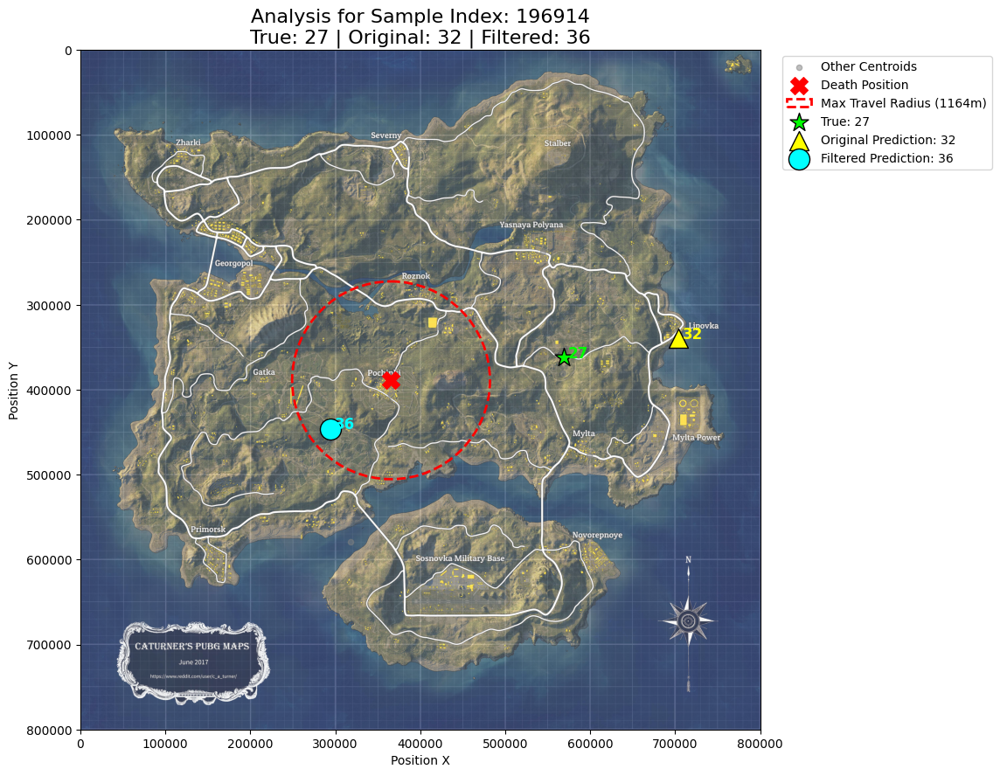

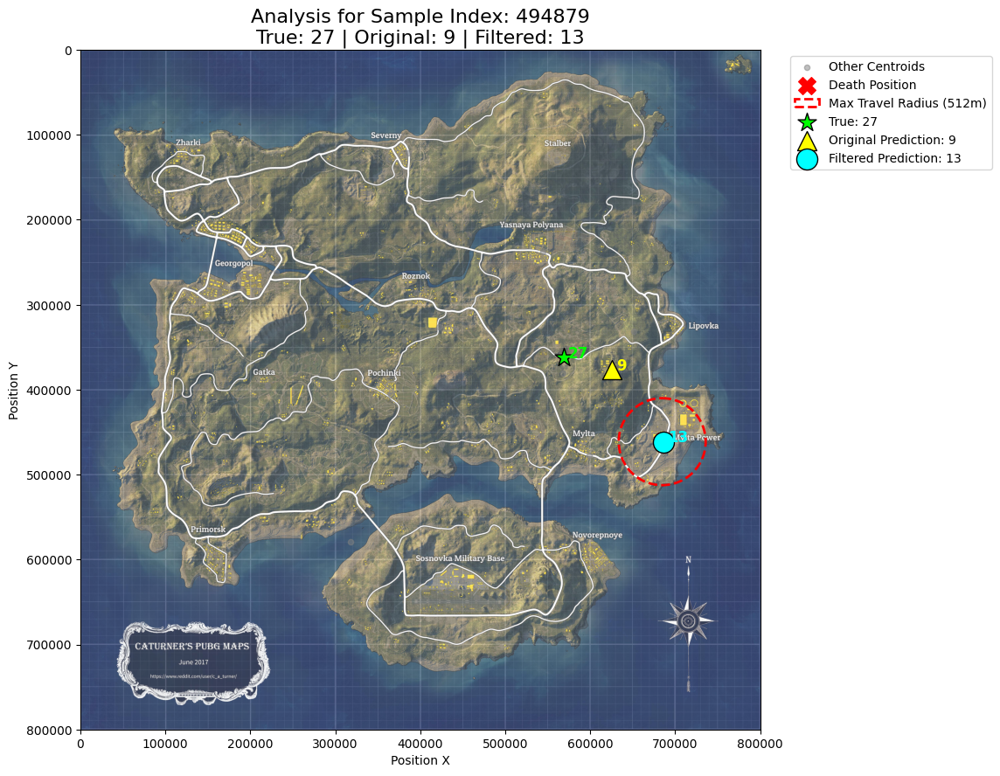

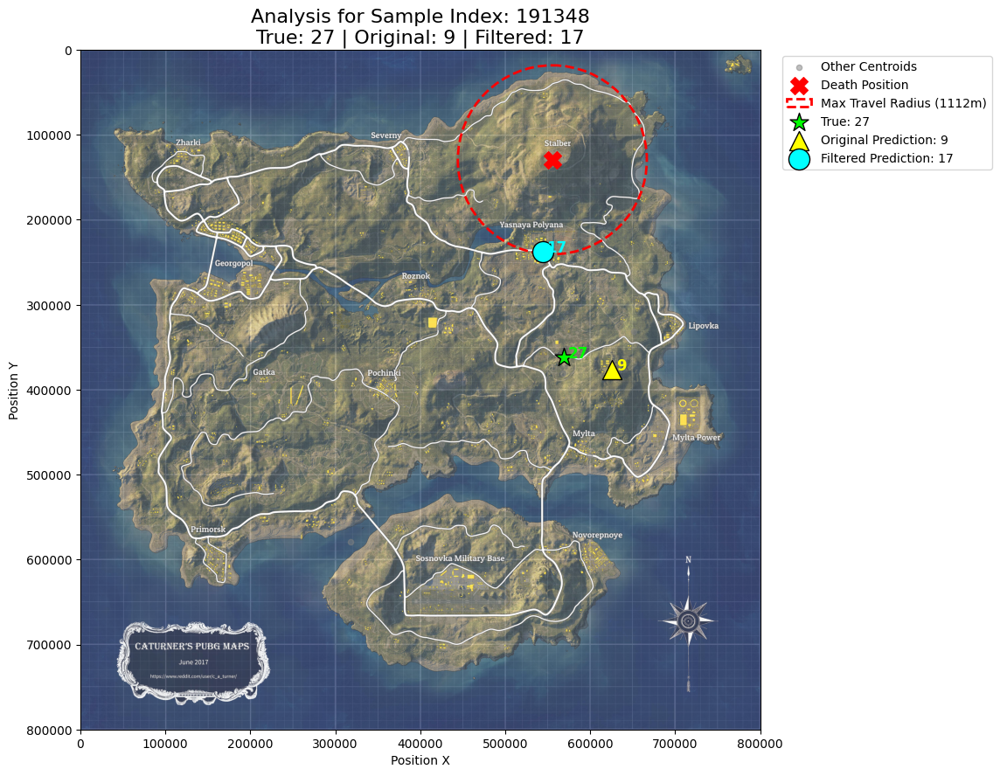

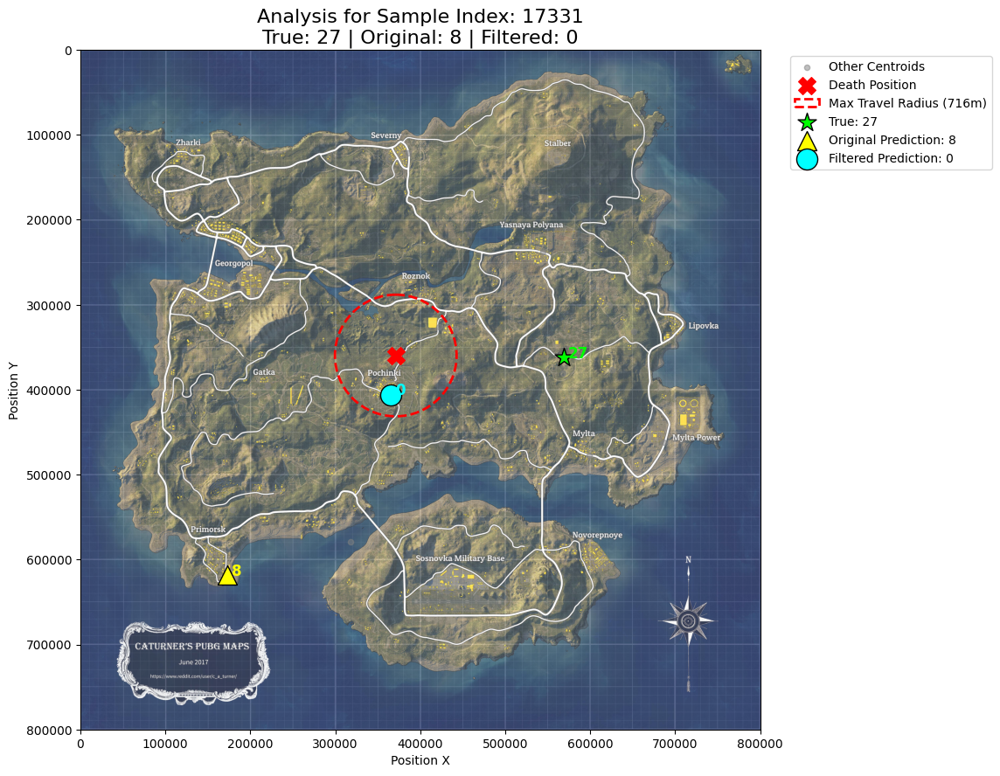

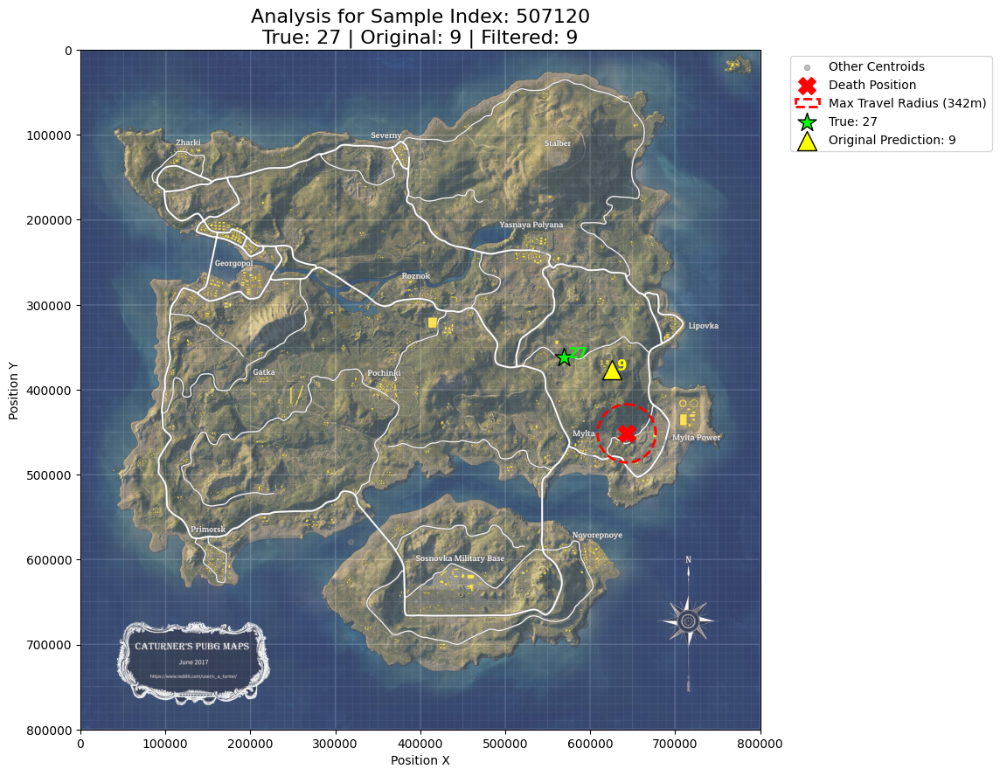

In [11]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tqdm.auto import tqdm
import json
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from matplotlib.patches import Circle

# ==============================================================================
# --- PART 1: 파일 로딩 및 분석 환경 재구성 ---
# ==============================================================================
print("--- 1. 파일 로딩 및 분석 환경 재구성 ---")
MODEL_DATA_PATH = 'formodel1.csv'; COORD_DATA_PATH = 'before clust.csv'
MODEL_SAVE_PATH = 'best_model_weighted.pth'; SCALER_SAVE_PATH = 'scaler.gz'
MAP_PATH = 'erangel.jpg'
N_CLASSES = 40

# 데이터 로딩 및 통합
try:
    df = pd.read_csv(MODEL_DATA_PATH)
    coord_df = pd.read_csv(COORD_DATA_PATH)
    df['killer_position_x'] = coord_df['killer_position_x']
    df['killer_position_y'] = coord_df['killer_position_y']
    print("데이터 로딩 및 통합 성공!")
except FileNotFoundError as e:
    print(f"오류: '{e.filename}' 파일을 찾을 수 없습니다. 실행을 중단합니다."); exit()

# 학습 때 사용했던 특징(12개)과 동일하게 구성
df_filtered = df[~df['killer_cluster'].isin([-1, 1])].copy()
total_dist = df_filtered['avg_player_dist_ride'] + df_filtered['avg_player_dist_walk']
survive_time = df_filtered['avg_player_survive_time']
df_filtered['avg_dist_per_time'] = np.divide(total_dist, survive_time, out=np.zeros_like(total_dist), where=survive_time!=0)
features = df_filtered.drop(columns=['player_name', 'killer_cluster', 'killer_position_x', 'killer_position_y'], errors='ignore')
target = df_filtered['killer_cluster']
n_features = len(features.columns)
print(f"분석에 사용될 특징 개수: {n_features}")

# 모델 아키텍처 정의 및 로딩
class Net(nn.Module):
    def __init__(self, num_features, num_classes):
        super(Net, self).__init__(); self.layer_1 = nn.Linear(num_features, 128); self.layer_2 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_classes); self.relu = nn.ReLU(); self.dropout = nn.Dropout(p=0.3)
    def forward(self, x):
        x = self.relu(self.layer_1(x)); x = self.dropout(x); x = self.relu(self.layer_2(x)); x = self.dropout(x)
        x = self.layer_out(x); return x

print("저장된 모델과 스케일러를 불러옵니다...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
try:
    INFERENCE_MODEL = Net(n_features, N_CLASSES).to(device)
    INFERENCE_MODEL.load_state_dict(torch.load(MODEL_SAVE_PATH))
    INFERENCE_MODEL.eval()
    INFERENCE_SCALER = joblib.load(SCALER_SAVE_PATH)
    print("모델 및 스케일러 로딩 완료.")
except Exception as e:
    print(f"!!! 오류: 모델 또는 스케일러 로딩에 실패했습니다. ({e})"); exit()

# 테스트 데이터 및 예측 결과 생성
_, X_test, _, y_test = train_test_split(features, target, test_size=0.2, random_state=42, stratify=target)
FEATURE_COLUMNS = X_test.columns.tolist()
X_test_scaled = INFERENCE_SCALER.transform(X_test)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)
with torch.no_grad():
    outputs = INFERENCE_MODEL(X_test_tensor)
    _, all_preds = torch.max(outputs.data, 1)
all_preds = all_preds.cpu().numpy()
print("테스트 데이터에 대한 예측 완료.")


# ==============================================================================
# --- PART 2: 추론 함수 정의 및 오분류 샘플 테스트 ---
# ==============================================================================
print("\n" + "="*60); print("--- 2. 추론 함수 정의 및 오분류 샘플 테스트 ---")
df_for_centroids = df[~df['killer_cluster'].isin([-1, 1])]
cluster_centroids = df_for_centroids.groupby('killer_cluster')[['killer_position_x', 'killer_position_y']].mean()
cluster_centroids_dict = cluster_centroids.to_dict('index')

# 추론 함수 정의
def predict_cluster_with_reachability_filter(player_data, centroids):
    player_data = player_data.copy()
    if 'avg_dist_per_time' not in player_data.columns:
        total_dist = player_data['avg_player_dist_ride'].values + player_data['avg_player_dist_walk'].values
        survive_time = player_data['avg_player_survive_time'].values
        player_data['avg_dist_per_time'] = np.divide(total_dist, survive_time, out=np.zeros_like(total_dist), where=survive_time!=0)
    player_data_ordered = player_data[FEATURE_COLUMNS]
    player_data_scaled = INFERENCE_SCALER.transform(player_data_ordered)
    player_tensor = torch.tensor(player_data_scaled, dtype=torch.float32).to(device)
    with torch.no_grad():
        outputs = INFERENCE_MODEL(player_tensor); probabilities = torch.softmax(outputs, dim=1)[0]
    original_prediction = torch.argmax(probabilities).item()
    if player_data['avg_player_survive_time'].iloc[0] == 0: max_travel_distance = 0
    else:
        avg_total_dist_meters = player_data['avg_player_dist_ride'].iloc[0] + player_data['avg_player_dist_walk'].iloc[0]
        avg_speed_units_per_sec = (avg_total_dist_meters * 100) / player_data['avg_player_survive_time'].iloc[0]
        max_travel_distance = avg_speed_units_per_sec * player_data['victim_time'].iloc[0]
    player_pos_x = player_data['victim_position_x'].iloc[0]; player_pos_y = player_data['victim_position_y'].iloc[0]
    reachable_clusters = []
    for cluster_id, coords in centroids.items():
        dist_to_centroid = np.sqrt((coords['killer_position_x'] - player_pos_x)**2 + (coords['killer_position_y'] - player_pos_y)**2)
        if dist_to_centroid <= max_travel_distance: reachable_clusters.append(cluster_id)
    if not reachable_clusters: final_prediction = original_prediction
    else:
        best_prob = -1; final_prediction = -1
        for cluster_id in reachable_clusters:
            if probabilities[cluster_id].item() > best_prob:
                best_prob = probabilities[cluster_id].item(); final_prediction = cluster_id
        if final_prediction == -1: final_prediction = original_prediction
    debug_info = { "max_travel_distance_unit": max_travel_distance, "victim_pos_x": player_pos_x, "victim_pos_y": player_pos_y }
    return final_prediction, original_prediction, debug_info

# 오분류된 27번 클러스터 데이터로 함수 테스트 및 시각화
results_df = pd.DataFrame({'true_cluster': y_test.values, 'predicted_cluster': all_preds}, index=y_test.index)
misclassified_27_df = results_df[(results_df['true_cluster'] == 27) & (results_df['predicted_cluster'] != 27)]
if misclassified_27_df.empty:
    print("테스트 데이터에 27번 클러스터 오분류 샘플이 없습니다.")
else:
    misclassified_indices = misclassified_27_df.index
    samples_to_test = df.loc[misclassified_indices]
    print(f"\n총 {len(samples_to_test)}개의 오분류 샘플 중 상위 5개에 대해 시각화합니다.\n")
    for idx, sample_row in samples_to_test.head().iterrows():
        sample_df = pd.DataFrame([sample_row])
        filtered_pred, original_pred, debug_info = predict_cluster_with_reachability_filter(sample_df, cluster_centroids_dict)
        
        # --- 시각화 시작 ---
        fig, ax = plt.subplots(figsize=(12, 12))
        try:
            erangel_map_img = Image.open(MAP_PATH); ax.imshow(erangel_map_img, extent=[0, 800000, 800000, 0], alpha=0.8)
        except FileNotFoundError:
            print(f"맵 이미지를 찾을 수 없어 배경 없이 진행합니다: {MAP_PATH}")

        # 모든 클러스터 중심점 (회색 점)
        ax.scatter(cluster_centroids['killer_position_x'], cluster_centroids['killer_position_y'], s=20, color='gray', alpha=0.5, label='Other Centroids')
        
        # 사망 위치 (붉은색 X)
        death_x, death_y = debug_info['victim_pos_x'], debug_info['victim_pos_y']
        ax.scatter(death_x, death_y, s=200, color='red', marker='X', label=f'Death Position')
        
        # 최대 이동 반경 (원)
        reach_circle = Circle((death_x, death_y), debug_info['max_travel_distance_unit'], color='red', fill=False, linestyle='--', linewidth=2, label=f"Max Travel Radius ({debug_info['max_travel_distance_unit']/100:.0f}m)")
        ax.add_patch(reach_circle)
        
        # 주요 클러스터 강조
        # 1. 실제 정답(27번)
        true_centroid = cluster_centroids.loc[27]
        ax.scatter(true_centroid['killer_position_x'], true_centroid['killer_position_y'], s=250, color='lime', marker='*', edgecolor='black', linewidth=1, label=f'True: 27')
        ax.text(true_centroid['killer_position_x']+5000, true_centroid['killer_position_y'], '27', color='lime', fontsize=12, weight='bold')
        
        # 2. 원본 예측
        original_centroid = cluster_centroids.loc[original_pred]
        ax.scatter(original_centroid['killer_position_x'], original_centroid['killer_position_y'], s=250, color='yellow', marker='^', edgecolor='black', linewidth=1, label=f'Original Prediction: {original_pred}')
        ax.text(original_centroid['killer_position_x']+5000, original_centroid['killer_position_y'], str(original_pred), color='yellow', fontsize=12, weight='bold')

        # 3. 필터링 후 최종 예측
        if filtered_pred != original_pred:
            filtered_centroid = cluster_centroids.loc[filtered_pred]
            ax.scatter(filtered_centroid['killer_position_x'], filtered_centroid['killer_position_y'], s=300, color='cyan', marker='o', edgecolor='black', linewidth=1, label=f'Filtered Prediction: {filtered_pred}')
            ax.text(filtered_centroid['killer_position_x']+5000, filtered_centroid['killer_position_y'], str(filtered_pred), color='cyan', fontsize=12, weight='bold')

        ax.set_title(f"Analysis for Sample Index: {idx}\nTrue: 27 | Original: {original_pred} | Filtered: {filtered_pred}", fontsize=16)
        ax.set_xlabel('Position X'); ax.set_ylabel('Position Y')
        ax.set_xlim(0, 800000); ax.set_ylim(800000, 0); ax.set_aspect('equal', adjustable='box')
        ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.0))
        plt.tight_layout()
        plt.show()

### 평가

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
from tqdm.auto import tqdm
import pandas as pd

# ==============================================================================
# --- PART 5: '도달 가능성 필터' 추론 함수 성능 평가 ---
# ==============================================================================
print("\n" + "="*60)
print("--- 5. '도달 가능성 필터' 추론 함수 파이프라인 전체 성능 평가 ---")
print(f"테스트 데이터 {len(X_test)}건에 대해 필터링 함수의 성능을 검증합니다.")
print("참고: 데이터 건수가 많아 다소 시간이 소요될 수 있습니다.")

# 예측 결과를 저장할 리스트
filtered_predictions = []
original_predictions = []

# X_test의 모든 행에 대해 predict_cluster_with_reachability_filter 함수를 실행
for index, row in tqdm(X_test.iterrows(), total=len(X_test), desc="필터링 함수 성능 평가 중"):
    # 함수에 넣기 위해 한 행(Series)을 DataFrame으로 변환
    single_row_df = pd.DataFrame([row])
    
    # 새로운 추론 함수 호출 (필터링된 결과와 원본 결과를 모두 반환)
    filtered_pred, original_pred = predict_cluster_with_reachability_filter(single_row_df, cluster_centroids_dict)
    
    # 결과 저장
    filtered_predictions.append(filtered_pred)
    original_predictions.append(original_pred)

print("성능 평가 완료!")

# 실제 정답 y_test와 두 종류의 예측 결과를 비교
y_true_labels = y_test.tolist()

# 정확도 계산
original_accuracy = accuracy_score(y_true_labels, original_predictions)
filtered_accuracy = accuracy_score(y_true_labels, filtered_predictions)

# 분류 리포트 생성
original_report = classification_report(y_true_labels, original_predictions, zero_division=0)
filtered_report = classification_report(y_true_labels, filtered_predictions, zero_division=0)


# --- 최종 성능 리포트 출력 ---
print("\n" + "#"*60)
print("### 최종 성능 비교 리포트 ###")
print("#"*60)

print("\n--- 🎯 정확도 비교 (Accuracy Comparison) ---")
print(f"모델 원본 예측 정확도 (필터링 전): {original_accuracy:.4f}")
print(f"필터 적용 후 예측 정확도 (필터링 후): {filtered_accuracy:.4f}")
if filtered_accuracy > original_accuracy:
    print(f"결과: 필터링을 통해 정확도가 {(filtered_accuracy - original_accuracy):.4f} 만큼 향상되었습니다! 🎉")
elif filtered_accuracy < original_accuracy:
    print(f"주의: 필터링으로 인해 정확도가 {(original_accuracy - filtered_accuracy):.4f} 만큼 하락했습니다. 😥")
else:
    print("결과: 필터링으로 인한 전체 정확도 변화는 없습니다.")

print("\n\n" + "-"*60)
print("--- 📊 상세 분류 리포트 (필터링 전) ---")
print(original_report)

print("\n" + "-"*60)
print("--- 📊 상세 분류 리포트 (필터링 후) ---")
print(filtered_report)
print("-"*60)

In [ ]:
import pandas as pd
import numpy as np

# --- PART 1: 분석 데이터 준비 ---
# 이 코드는 이전 셀에서 모델 평가(classification_report)까지 완료된 직후 실행해야 합니다.
# 필요한 변수: all_labels, all_preds, X_test, y_test

print("--- 27번 클러스터 오분류 상세 분석 ---")

# ⭐️ --- 핵심 수정 사항: 인덱스 정렬 ---
# all_labels, all_preds로 데이터프레임을 만들 때, y_test의 인덱스를 그대로 사용합니다.
results_df = pd.DataFrame({
    'true_cluster': all_labels,
    'predicted_cluster': all_preds
}, index=y_test.index)
# ----------------------------------------


# '실제는 27번'이지만, '다른 번호로 잘못 예측된' 경우 필터링
misclassified_as_27 = results_df[
    (results_df['true_cluster'] == 27) & (results_df['predicted_cluster'] != 27)
]

if misclassified_as_27.empty:
    print("\n축하합니다! 27번 클러스터를 잘못 예측한 샘플이 하나도 없습니다.")
else:
    # --- 어떤 '다른 클러스터'로 오인되었는지 확인 ---
    print("\n--- 🔍 27번 클러스터가 주로 오인되는 다른 클러스터 TOP 5 ---")
    error_counts = misclassified_as_27['predicted_cluster'].value_counts()
    print(error_counts.head(5))
    
    # --- 잘못 예측된 원본 샘플 데이터 확인 ---
    # 잘못 예측된 샘플들의 인덱스를 가져옵니다.
    misclassified_indices = misclassified_as_27.index
    
    # ⭐️ X_test에서 .loc을 사용해 해당 인덱스의 원본 데이터를 정확히 추출합니다.
    misclassified_samples = X_test.loc[misclassified_indices]
    
    # 분석의 편의를 위해 예측 결과도 함께 붙여줍니다.
    misclassified_samples_with_pred = pd.concat([
        misclassified_samples,
        misclassified_as_27[['true_cluster', 'predicted_cluster']]
    ], axis=1)

    print("\n--- 😱 27번인데 다른 클러스터로 오인된 샘플 데이터 (상위 5개) ---")
    print(misclassified_samples_with_pred.head())

### 시각화

--- 1. 데이터 로딩: formodel1.csv ---
파일 로딩 성공!
원본 데이터 614089개 -> 유효한 클러스터 데이터 611570개 사용

--- 3. 시각화를 위해 100000개의 데이터를 샘플링합니다. ---

--- 4. 지도 위에 클러스터별로 모든 포인트 시각화 ---


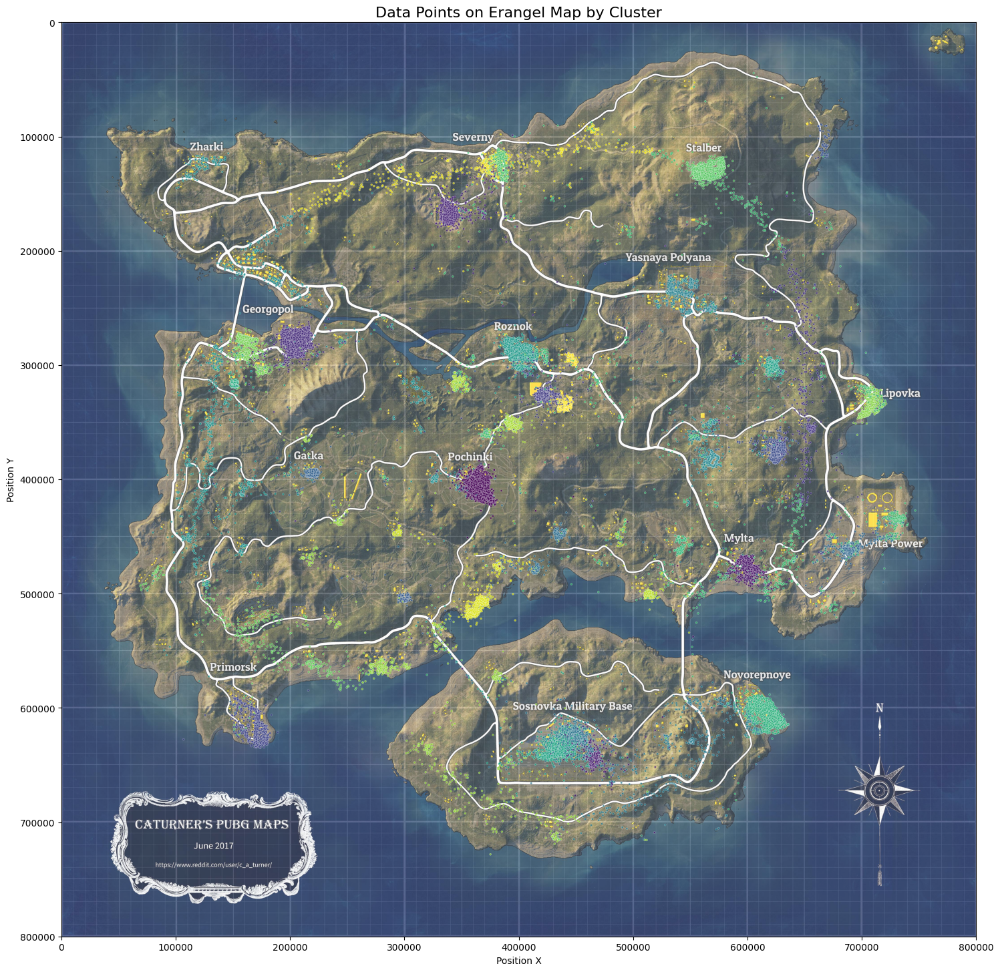

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# --- 1. 파일 경로 및 데이터 로딩 ---
DATA_PATH = 'formodel1.csv'
MAP_PATH = 'erangel.jpg'

print(f"--- 1. 데이터 로딩: {DATA_PATH} ---")
try:
    df = pd.read_csv(DATA_PATH)
    print("파일 로딩 성공!")
except FileNotFoundError:
    print(f"오류: '{DATA_PATH}' 파일을 찾을 수 없습니다. 실행을 중단합니다.")
    exit()

# --- 2. 데이터 전처리 ---
# -1 클러스터(유효하지 않은 좌표)는 시각화에서 제외
# 1번 클러스터((0,0) 좌표)도 의미가 없으므로 함께 제외
df_filtered = df[~df['killer_cluster'].isin([-1, 1])].copy()
print(f"원본 데이터 {len(df)}개 -> 유효한 클러스터 데이터 {len(df_filtered)}개 사용")

# --- 3. 데이터 샘플링 ---
# 데이터가 너무 많으면 시각화가 느려지므로, 최대 10만개만 무작위로 샘플링합니다.
# 데이터가 10만개보다 적으면 전체를 사용합니다.
n_samples = min(100000, len(df_filtered))
df_sample = df_filtered.sample(n=n_samples, random_state=42)
print(f"\n--- 3. 시각화를 위해 {n_samples}개의 데이터를 샘플링합니다. ---")


# --- 4. 지도 위에 모든 포인트 시각화 ---
print("\n--- 4. 지도 위에 클러스터별로 모든 포인트 시각화 ---")
plt.figure(figsize=(15, 15))

# 맵 이미지 배경으로 그리기
try:
    erangel_map_img = Image.open(MAP_PATH)
    # extent 파라미터로 좌표계를 좌상단 (0,0) 기준으로 설정
    plt.imshow(erangel_map_img, extent=[0, 800000, 800000, 0], alpha=0.8)
except FileNotFoundError:
    print(f"맵 이미지를 찾을 수 없어 배경 없이 진행합니다: {MAP_PATH}")

# Seaborn으로 샘플링된 데이터의 산점도 그리기
sns.scatterplot(
    data=df_sample,
    x='victim_position_x', # 지도에 표시할 X좌표 컬럼
    y='victim_position_y', # 지도에 표시할 Y좌표 컬럼
    hue='killer_cluster',  # 'killer_cluster' 컬럼 기준으로 색상 구분
    palette='viridis',     # 40개 클래스를 구분하기 위한 색상 팔레트
    s=5,                   # 점 크기
    alpha=0.7,
    legend=False           # 범례가 너무 많아 지저분하므로 숨김
)

plt.title('Data Points on Erangel Map by Cluster', fontsize=16)
plt.xlabel('Position X')
plt.ylabel('Position Y')
plt.xlim(0, 800000)
plt.ylim(800000, 0)
plt.grid(False)
plt.gca().set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

--- 2. 데이터 파일 로딩 ---
두 개의 CSV 파일 로딩 성공!

--- 3. 좌표와 클러스터 데이터 결합 ---
데이터 결합 완료.
   killer_position_x  killer_position_y  killer_cluster
0           199213.8           292095.2               5
1           358682.8           298949.7              27
2                0.0                0.0              -1
3           391272.6           346693.7              34
4           421163.2           324833.1               7

--- 4. 데이터 전처리 및 중심점 계산 ---
클러스터별 중심 좌표 계산 완료.

--- 5. 지도 위에 시각화 ---


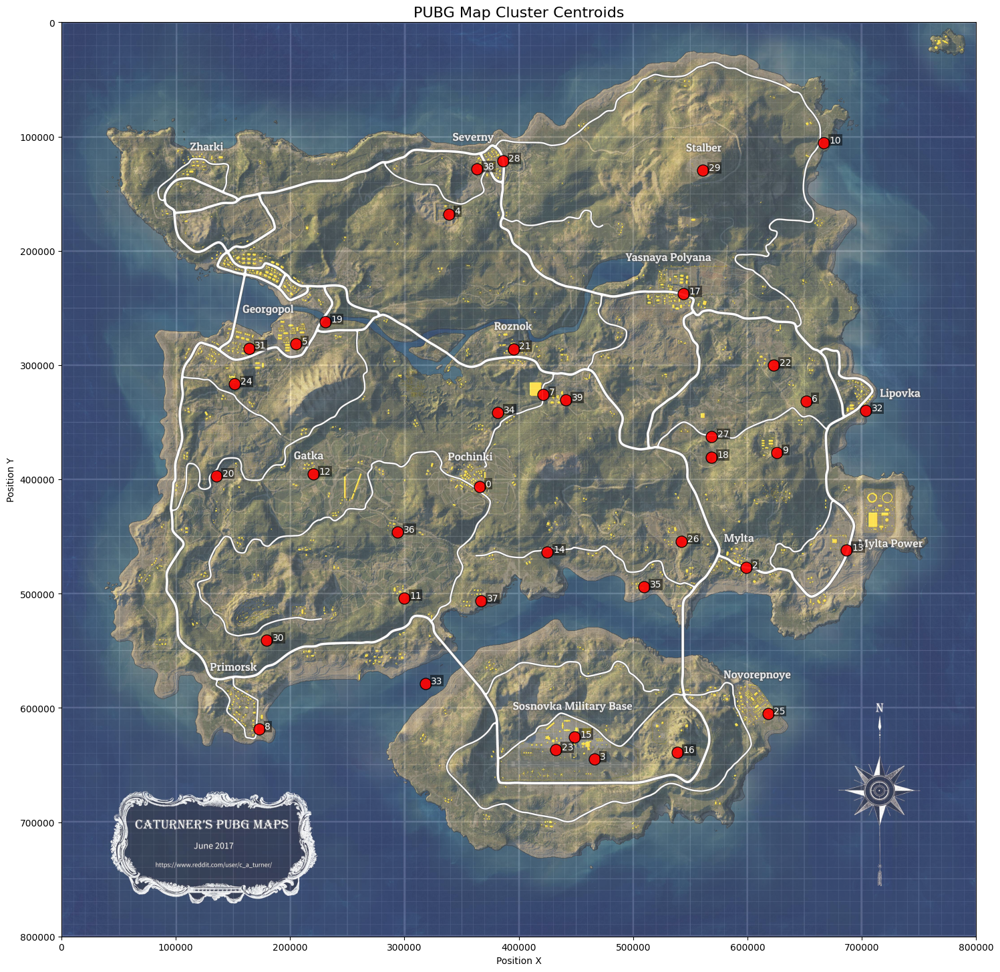

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np

# --- 1. 파일 경로 설정 ---
COORD_DATA_PATH = 'before clust.csv' # 좌표 데이터 파일
CLUSTER_DATA_PATH = 'formodel1.csv'  # 클러스터 데이터 파일
MAP_PATH = 'erangel.jpg'             # 맵 이미지

# --- 2. 두 개의 CSV 파일 로딩 ---
print("--- 2. 데이터 파일 로딩 ---")
try:
    # 좌표 정보가 있는 파일 로드
    coord_df = pd.read_csv(COORD_DATA_PATH)
    # 클러스터 정보가 있는 파일 로드
    cluster_df = pd.read_csv(CLUSTER_DATA_PATH)
    print("두 개의 CSV 파일 로딩 성공!")
except FileNotFoundError as e:
    print(f"오류: '{e.filename}' 파일을 찾을 수 없습니다. 실행을 중단합니다.")
    exit()

# --- 3. ⭐️ 두 데이터프레임 결합 ---
print("\n--- 3. 좌표와 클러스터 데이터 결합 ---")
# 두 파일이 동일한 순서와 길이를 가진다고 가정하고, 필요한 컬럼만 옆으로 이어 붙입니다.
merged_df = pd.concat([
    coord_df[['killer_position_x', 'killer_position_y']],
    cluster_df['killer_cluster']
], axis=1)
print("데이터 결합 완료.")
print(merged_df.head())


# --- 4. 데이터 전처리 및 중심점 계산 ---
print("\n--- 4. 데이터 전처리 및 중심점 계산 ---")
# 의미 없는 -1과 1 클러스터 제외
df_filtered = merged_df[~merged_df['killer_cluster'].isin([-1, 1])].copy()

# 'killer_cluster'로 그룹화하여 중심점 계산
coord_cols = ['killer_position_x', 'killer_position_y']
cluster_centroids = df_filtered.groupby('killer_cluster')[coord_cols].mean().reset_index()
print("클러스터별 중심 좌표 계산 완료.")


# --- 5. 지도 위에 중심점 및 클러스터 번호 시각화 ---
print("\n--- 5. 지도 위에 시각화 ---")
plt.figure(figsize=(15, 15))

# 맵 이미지 배경
try:
    erangel_map_img = Image.open(MAP_PATH)
    plt.imshow(erangel_map_img, extent=[0, 800000, 800000, 0], alpha=0.8)
except FileNotFoundError:
    print(f"맵 이미지를 찾을 수 없어 배경 없이 진행합니다: {MAP_PATH}")

# 중심점 그리기
sns.scatterplot(
    data=cluster_centroids,
    x=coord_cols[0],
    y=coord_cols[1],
    s=150, color='red', edgecolor='black', alpha=0.9, legend=False
)

# 각 중심점 옆에 클러스터 번호 표시
for i, point in cluster_centroids.iterrows():
    plt.text(
        point[coord_cols[0]] + 5000,
        point[coord_cols[1]],
        str(int(point['killer_cluster'])),
        fontsize=10, color='white',
        bbox=dict(facecolor='black', alpha=0.5, pad=1, edgecolor='none')
    )

plt.title('PUBG Map Cluster Centroids', fontsize=16)
plt.xlabel('Position X'); plt.ylabel('Position Y')
plt.xlim(0, 800000); plt.ylim(800000, 0)
plt.grid(False); plt.gca().set_aspect('equal', adjustable='box'); plt.tight_layout()
plt.show()

In [8]:
import numpy as np
from sklearn.metrics import confusion_matrix

# --- 사용자 설정 영역 ---
# 모델 평가 후 얻은 실제 값과 예측 값을 아래 변수에 할당해주세요.
y_true = all_labels  # 예: y_test
y_pred = all_preds  # 예: model.predict(X_test)
# --------------------

# 1. 혼동 행렬(Confusion Matrix) 계산
cm = confusion_matrix(y_true, y_pred)

# 2. 실제 클래스가 '27번'인 경우의 예측 결과 추출 (혼동 행렬의 27번 행)
predictions_for_class_27 = cm[27]

# 3. 올바르게 예측된 경우(27 -> 27)를 제외하고 가장 많이 예측된 클래스 찾기
# 먼저, 올바르게 예측한 자기 자신의 개수는 임시로 0으로 만듭니다.
temp_preds = np.copy(predictions_for_class_27)
temp_preds[27] = 0

# 4. temp_preds에서 가장 큰 값의 인덱스(클래스 번호)를 찾습니다.
most_confused_class = np.argmax(temp_preds)
misclassification_count = temp_preds[most_confused_class]

# --- 결과 출력 ---
total_samples = np.sum(predictions_for_class_27)
correct_count = predictions_for_class_27[27]

print(f"📊 실제 '27번' 클래스 분석 결과")
print("-" * 35)
print(f"총 샘플 수: {total_samples}개")
print(f"  - ✅ 올바르게 예측 (27번 -> 27번): {correct_count}개")
print(f"  - ❌ 잘못 예측: {total_samples - correct_count}개")
print("\n" + "=" * 35 + "\n")
print(f"🔥 '27번' 클래스가 가장 많이 잘못 예측된 클래스는 [ {most_confused_class}번 ] 입니다.")
print(f"   ({misclassification_count}번 이나 '{most_confused_class}'번으로 잘못 예측되었습니다.)")
print("=" * 35)

📊 실제 '27번' 클래스 분석 결과
-----------------------------------
총 샘플 수: 1023개
  - ✅ 올바르게 예측 (27번 -> 27번): 1000개
  - ❌ 잘못 예측: 23개


🔥 '27번' 클래스가 가장 많이 잘못 예측된 클래스는 [ 37번 ] 입니다.
   (9번 이나 '37'번으로 잘못 예측되었습니다.)


In [2]:
import pandas as pd
dff = pd.read_csv('merged_victim_filtered_time_420.csv')
dff

,player_name,total_games,avg_player_assists,avg_player_dbno,avg_player_dist_ride,avg_player_dist_walk,avg_player_dmg,avg_player_kills,avg_player_survive_time,avg_team_placement,...,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_placement,victim_position_x,victim_position_y
0,King_WZRD,103,0.233010,0.796117,1345.951473,1085.605221,199.456311,1.456311,802.108660,24.553398,...,VisionRyo,7.0,170443.8,626352.3,ERANGEL,2U4GBNA0YmkmDb3R7LkAxe-ZFTMUfHNpbzqMCrSAre0Sxb...,311,24.0,170249.0,626338.9
1,King_WZRD,103,0.233010,0.796117,1345.951473,1085.605221,199.456311,1.456311,802.108660,24.553398,...,zjbaba666,35.0,0.0,0.0,MIRAMAR,2U4GBNA0YmlfpD6dKjSwIZqyijNV7MDXZTtY9K2VY8XrLq...,171,33.0,638842.8,451543.7
2,King_WZRD,103,0.233010,0.796117,1345.951473,1085.605221,199.456311,1.456311,802.108660,24.553398,...,DuttyLongStick,3.0,367018.1,438659.3,MIRAMAR,2U4GBNA0YmljOLofzH4dp_qSyxjDRMF2KRtbftOB5VFoYG...,324,20.0,370376.3,435686.2
3,King_WZRD,103,0.233010,0.796117,1345.951473,1085.605221,199.456311,1.456311,802.108660,24.553398,...,0_Schwifty_0,24.0,180974.0,224896.4,ERANGEL,2U4GBNA0YmmsnJF6DeoUwcWzUkccd9TBy2x-WWToGSsE2H...,341,36.0,180509.3,224658.2
4,King_WZRD,103,0.233010,0.796117,1345.951473,1085.605221,199.456311,1.456311,802.108660,24.553398,...,WeedJunkyMonkey,25.0,364241.5,408373.2,ERANGEL,2U4GBNA0YmnK1LGf62b8X05eFkLcu3P2ROX9gWxOWi-14r...,161,22.0,364223.5,408170.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9562791,feifan007,52,0.173077,0.307692,803.974356,1210.144646,62.653846,0.384615,740.058635,21.519231,...,SoMnoLece,15.0,601504.4,618507.4,ERANGEL,2U4GBNA0YmkiEB4kHC1lECH1YuUvwSUQoMLIP9gMmMcAah...,401,2.0,599430.9,617136.4
9562792,feifan007,52,0.173077,0.307692,803.974356,1210.144646,62.653846,0.384615,740.058635,21.519231,...,WarnCadaver,45.0,420898.8,323948.7,ERANGEL,2U4GBNA0YmmvIOCGi2MaxCuBavLjRRtHgdCm6r9LGpy1R3...,114,47.0,420867.6,325289.8
9562793,feifan007,52,0.173077,0.307692,803.974356,1210.144646,62.653846,0.384615,740.058635,21.519231,...,ChanDaMan,20.0,423643.3,324161.9,ERANGEL,2U4GBNA0YmmgmpA8sIpjhkRHK30wbPyP2etfEZGDKM742N...,127,15.0,423883.8,324206.8
9562794,feifan007,52,0.173077,0.307692,803.974356,1210.144646,62.653846,0.384615,740.058635,21.519231,...,EjderYalcin,4.0,432358.2,438295.4,ERANGEL,2U4GBNA0Ymlkbkb4VAhg_GZ5o-8IuusW0jqDWcs4CIW3pM...,317,38.0,432224.5,440476.1


In [ ]:
dff[dff['time']<=120]